# Neural Style Transfer for Art

In this notebook I am going to apply Neural Style Transfer to capture the style of famous painters and apply it to pictures taken by me or to some other famous painters' works.

**DISCLAIMER: This does not want to be a theoretical explanation of the principles of Deep Learning or Neural Style Transfer, but just a short and easy guide to a practical and very quick way to turn pictures into paintings!**

The main idea behind the procedure to keep in mind is: we have 2 images, from the first one we capture its **content** and from the second one we capture its "**style**".

So, if the latter one (the "style" one) is for example the image from a painting, we can say that we are, in some way, **stealing the author's style!**

Please note that this second image can be just another picture, or a drawing, or whatever...
And also the first image (the "content" one) does not necessarily has to be a picture, but, for example, another painting! Why not taking the content from a Dalì painting and applying the Van Gogh's style to it?

Being an art passionate, I also have an Instagram page where I show the results of this hobby:

**Ig: @Pictures_made_paintings**

Please, feel free to have a look at it and, if you like my work, follow it!

## Importing libraries

In [1]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import PIL.Image
import tensorflow_hub as hub
import os
from typing import List

In [2]:
print('\n'.join(f'{m.__name__} {m.__version__}' for m in globals().values() if getattr(m, '__version__', None)))

tensorflow 2.0.0
numpy 1.19.3
PIL 8.1.0
tensorflow_hub 0.10.0


## Defining useful functions and models

This function displays all the pictures inside a list (We'll use it at the end to show our generated images)

In [3]:
def show_images(images: List[np.ndarray]) -> None:
    n: int = len(images)
    f = plt.figure(figsize=(20,20))
    for i in range(n):
        
        f.add_subplot(1, n, i + 1)
        plt.imshow(images[i])

    plt.show(block=True)

This function loads an image from a path and transforms it into a tensor (step needed before feeding it to the neural network).
In case of style image it is recommended to resize it (resize = True) to improve the quality of resulting blended image

In [4]:
def image_to_tensor(path_to_img, resize=False):
    img = tf.io.read_file(path_to_img)
    img = tf.image.decode_image(img, channels=3, dtype=tf.float32)
    if resize==True:
        img = tf.image.resize(img, [256, 256])
    img = img[tf.newaxis, :]
    return img

These 2 functions perform the inverse operation, by transforming a tensor into an image. The first one also shows the result. These are needed to see our generated images

In [5]:
def tensor_to_image(tensor):
    tensor = tensor*255
    tensor = np.array(tensor, dtype=np.uint8)
    tensor = tensor[0]
    plt.figure(figsize=(20,10))
    plt.axis('off')
    return plt.imshow(tensor)

def tensor_to_image2(tensor):
    tensor = tensor*255
    tensor = np.array(tensor, dtype=np.uint8)
    tensor = tensor[0]
    return tensor

Here the true power of Tensorflow_Hub is seen: we are downloading a pre-trained model for image style transfer

In [6]:
hub_module = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')

## Turning picture into a singular painting

**In case you already know which style to apply to your picture, just use the following code**

Paths to content and style images

In [7]:
content_path = r'content/fisherman.png'
style_path = r'styles/starrynight.jpg'

Displaying images

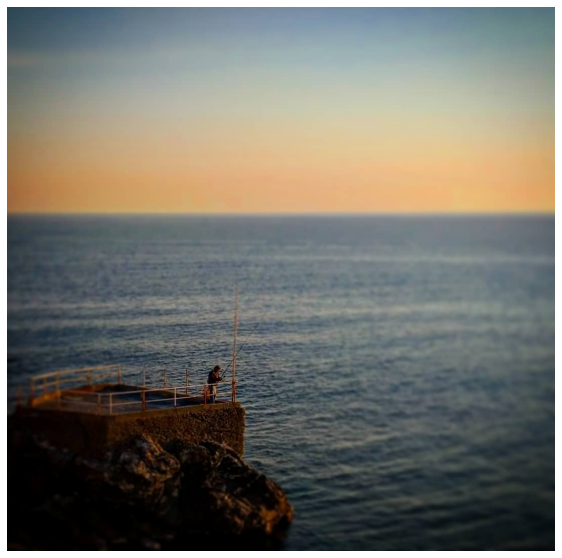

In [8]:
# content image

content_image_tensor = image_to_tensor(content_path)
tensor_to_image(content_image_tensor)

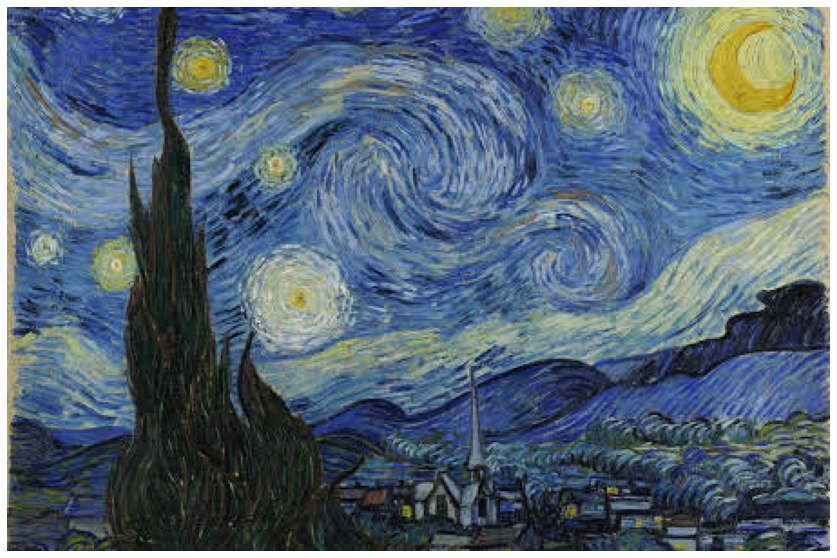

In [9]:
# style image

style_image_tensor = image_to_tensor(style_path)
tensor_to_image(style_image_tensor)

Blending images, applying style from "style image" to content from "content image" thanks to *hub_module*

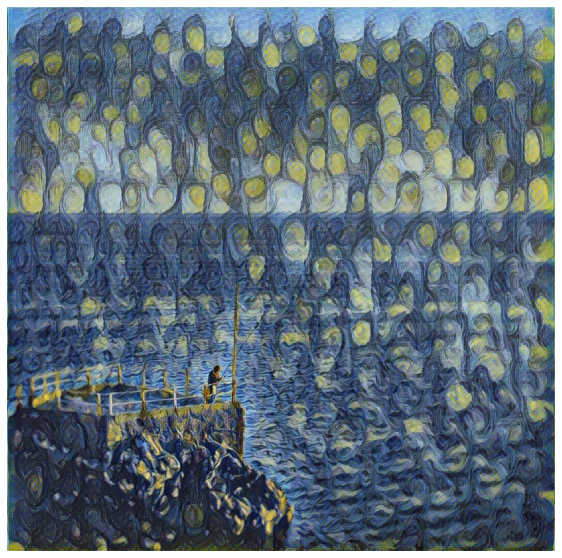

In [10]:
content_image_tensor = image_to_tensor(content_path)
style_image_tensor = image_to_tensor(style_path, True)

combined_result = hub_module(tf.constant(content_image_tensor), tf.constant(style_image_tensor))[0]

tensor_to_image(combined_result)

## Turning picture into many paintings

**In case you want to try different styles instead, just use this code**

Importing content image and turning it into tensor

In [11]:
content_path = r'content/fisherman.png'
content_image_tensor = image_to_tensor(content_path)

Select folder where style images are

In [12]:
path = r'styles/'

Blending images, applying style from "style images" to content from "content image" thanks to *hub_module*.

A ordered list of used styles is displayed.

In [13]:
list_pic = []
n = 0
for style_path in os.listdir(path):
    style_image_tensor = image_to_tensor(path+style_path,True)
    combined_result = hub_module(tf.constant(content_image_tensor), tf.constant(style_image_tensor))[0]
    print(n, ": ", style_path[:-4])
    results = tensor_to_image2(combined_result)
    list_pic.append(results)
    n+=1

0 :  1884-De-Nittis-colazione-in-giardino
1 :  Alfons_Mucha_Moon_1902
2 :  chagall-anniversaire_1915
3 :  dalì
4 :  dechirico
5 :  Franz Marc
6 :  G.Arcimboldo_L'imperatore Rodolfo II in veste di Vertumno_1591
7 :  Georges_Seurat_La Seine à la Grande-Jatte_1888
8 :  Henri-Toulouse-Lautrec_Au lit le baiser_1892
9 :  hokusai
10 :  JeanneHebuterne_Modigliani_1917
11 :  kandinsky7
12 :  Leonardo
13 :  matrix
14 :  miro-figure-di-notte-guidate-da-tracce-fosforescenti-di-lumache
15 :  monet
16 :  monet_Impression, soleil levant_1873
17 :  nebula
18 :  Pilastricreazione
19 :  starrynight
20 :  turner
21 :  umberto_boccioni_dinamismo-di-un-ciclista_1913
22 :  urlomunch
23 :  vangoghfield


Displaying generated images

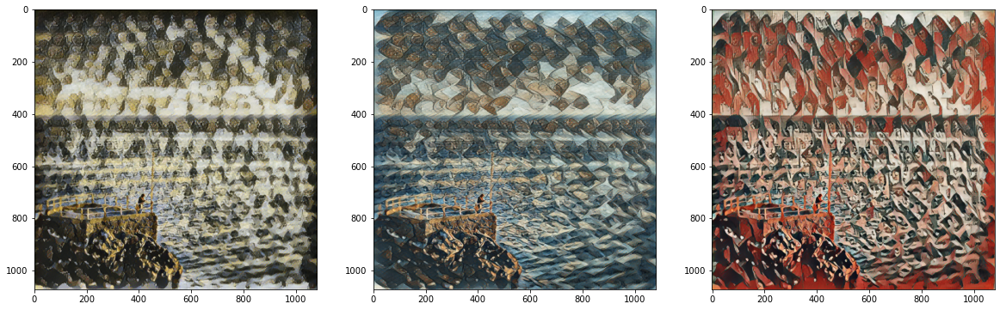

In [14]:
show_images(list_pic[0:3]) 

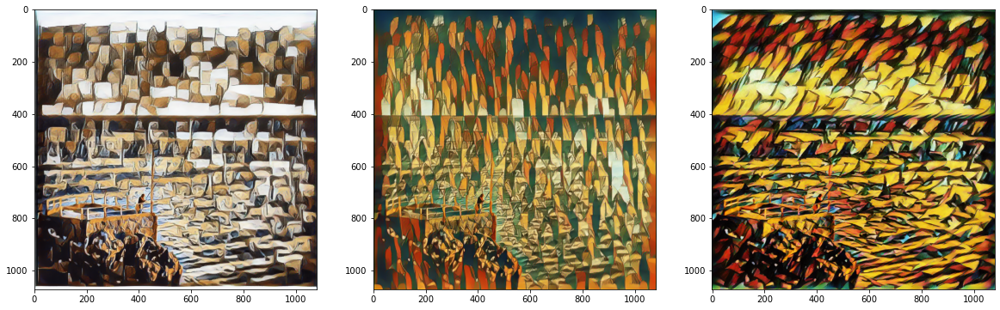

In [15]:
show_images(list_pic[3:6]) 

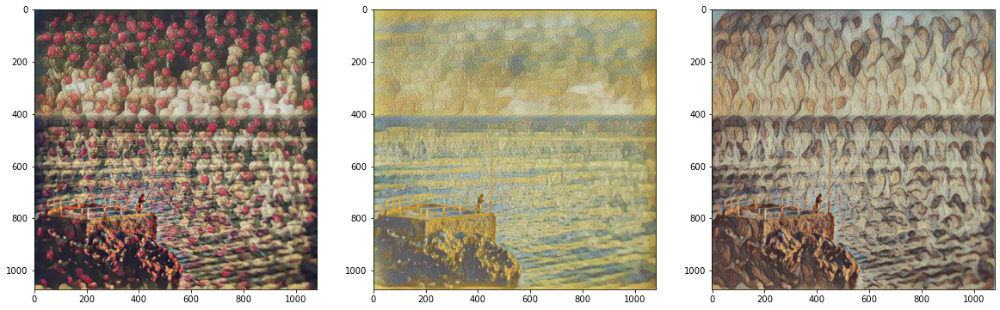

In [16]:
show_images(list_pic[6:9]) 

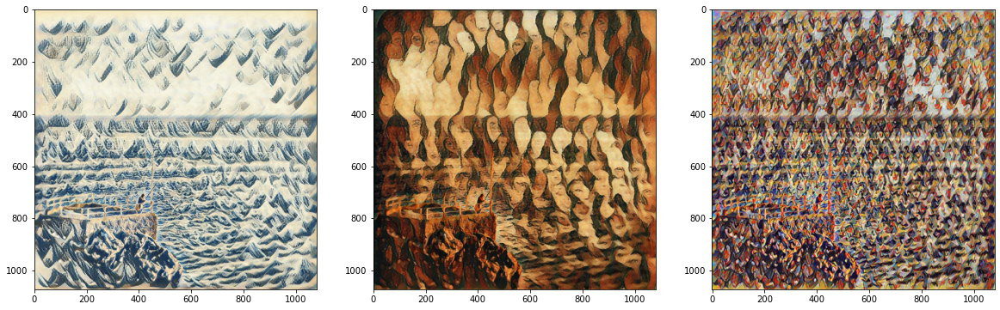

In [17]:
show_images(list_pic[9:12]) 

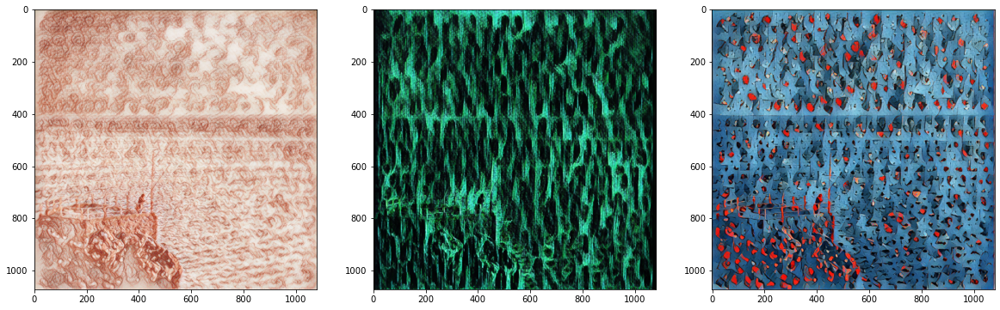

In [18]:
show_images(list_pic[12:15]) 

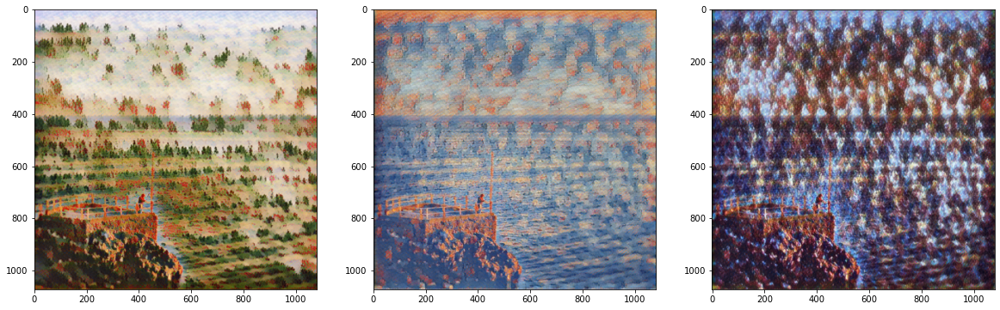

In [19]:
show_images(list_pic[15:18]) 

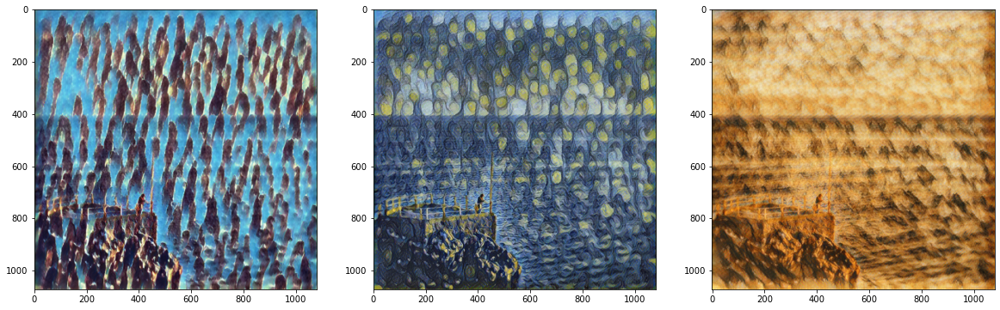

In [20]:
show_images(list_pic[18:21]) 

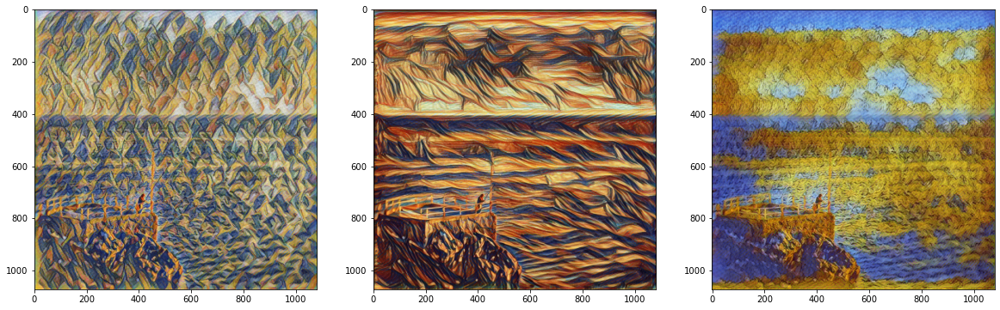

In [21]:
show_images(list_pic[21:24]) 